<a href="https://colab.research.google.com/github/nithyasreesanaka/Projects-Eng-/blob/main/RoadImageSegmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip /content/drive/MyDrive/archive\ \(3\).zip -d /content/


Streaming output truncated to the last 5000 lines.
  inflating: /content/train/723199_sat.jpg  
  inflating: /content/train/723226_mask.png  
  inflating: /content/train/723226_sat.jpg  
  inflating: /content/train/723436_mask.png  
  inflating: /content/train/723436_sat.jpg  
  inflating: /content/train/723483_mask.png  
  inflating: /content/train/723483_sat.jpg  
  inflating: /content/train/723622_mask.png  
  inflating: /content/train/723622_sat.jpg  
  inflating: /content/train/723722_mask.png  
  inflating: /content/train/723722_sat.jpg  
  inflating: /content/train/723970_mask.png  
  inflating: /content/train/723970_sat.jpg  
  inflating: /content/train/723990_mask.png  
  inflating: /content/train/723990_sat.jpg  
  inflating: /content/train/724095_mask.png  
  inflating: /content/train/724095_sat.jpg  
  inflating: /content/train/724431_mask.png  
  inflating: /content/train/724431_sat.jpg  
  inflating: /content/train/724485_mask.png  
  inflating: /content/train/724485_sat.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50  # Using ResNet50 instead of ResNeXt
from sklearn.model_selection import train_test_split
import cv2

print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.19.0


In [ ]:
def load_and_preprocess(img_path, mask_path, target_size=(256, 256)): # Changed target_size to (256, 256)
    img = cv2.imread(os.path.join(train_dir, img_path.decode()))
    img = cv2.resize(img, target_size)
    img = img / 255.0  # Normalize to [0,1]

    mask = cv2.imread(os.path.join(train_dir, mask_path.decode()), cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, target_size)
    mask = (mask > 127).astype(np.float32)  # Binarize
    mask = np.expand_dims(mask, axis=-1)    # Add channel dimension
    return img.astype(np.float32), mask


def augment_data(image, mask):
    # Random flips
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

    # Random brightness/contrast
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)

    return image, mask

def create_dataset(image_list, mask_list, batch_size=16, augment=False):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(lambda x, y: tf.numpy_function(
        load_and_preprocess, [x, y], [tf.float32, tf.float32]),
        num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.map(lambda x, y: (tf.reshape(x, [256, 256, 3]), tf.reshape(y, [256, 256, 1]))) # Changed reshape to (256, 256)

    if augment:
        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    return dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Create datasets
train_dataset = create_dataset(X_train, y_train, augment=True)
val_dataset = create_dataset(X_val, y_val)
test_dataset = create_dataset(X_test, y_test)

In [ ]:
def create_attention_deeplabv3_plus(input_shape=(192, 192, 3)):
    # 1. Backbone (ResNet50)
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    # 2. Feature Extraction
    s2 = base_model.get_layer('conv2_block3_out').output  # 64x64 at 256x256 input
    s3 = base_model.get_layer('conv3_block4_out').output  # 32x32
    s4 = base_model.get_layer('conv4_block6_out').output  # 16x16

    # 3. Channel Attention Module (Squeeze-and-Excitation)
    def channel_attention(x, ratio=16):
        channel = x.shape[-1]

        # Squeeze (Global Average Pooling)
        squeeze = layers.GlobalAveragePooling2D()(x)

        # Excitation (FC layers with reduction)
        excitation = layers.Reshape((1, 1, channel))(squeeze)
        excitation = layers.Dense(channel // ratio, activation='relu', use_bias=False)(excitation)
        excitation = layers.Dense(channel, activation='sigmoid', use_bias=False)(excitation)

        # Scale the input
        return layers.Multiply()([x, excitation])

    # 4. Spatial Attention Module
    def spatial_attention(x):
        # Generate spatial attention map
        avg_pool = layers.Lambda(lambda x: K.mean(x, axis=-1, keepdims=True))(x)
        max_pool = layers.Lambda(lambda x: K.max(x, axis=-1, keepdims=True))(x)

        concat = layers.Concatenate(axis=-1)([avg_pool, max_pool])

        spatial = layers.Conv2D(1, kernel_size=7, padding='same', use_bias=False)(concat)
        spatial = layers.BatchNormalization()(spatial)
        spatial_map = layers.Activation('sigmoid')(spatial)

        # Apply attention
        return layers.Multiply()([x, spatial_map])

    # 5. Convolutional Block Attention Module (CBAM)
    def cbam_block(x):
        x = channel_attention(x)
        x = spatial_attention(x)
        return x

    # 6. Enhanced ASPP Module with Attention
    def aspp_attention_block(x, num_filters=256):
        # 1x1 Conv
        b1 = layers.Conv2D(num_filters, 1, padding='same', use_bias=False)(x)
        b1 = layers.BatchNormalization()(b1)
        b1 = layers.Activation('relu')(b1)

        # Dilated Convs with attention
        rates = [6, 12, 18]
        branches = []
        for r in rates:
            branch = layers.Conv2D(num_filters, 3, dilation_rate=r, padding='same', use_bias=False)(x)
            branch = layers.BatchNormalization()(branch)
            branch = layers.Activation('relu')(branch)
            branch = cbam_block(branch)  # Add attention to each branch
            branches.append(branch)

        # Global Pooling
        b4 = layers.GlobalAveragePooling2D()(x)
        b4 = layers.Reshape((1, 1, x.shape[-1]))(b4)
        b4 = layers.Conv2D(num_filters, 1, use_bias=False)(b4)
        b4 = layers.BatchNormalization()(b4)
        b4 = layers.Activation('relu')(b4)
        b4 = layers.UpSampling2D(size=(x.shape[1], x.shape[2]), interpolation='bilinear')(b4)

        # Concatenate
        x = layers.Concatenate()([b1, *branches, b4])
        x = layers.Conv2D(num_filters, 1, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)

        # Apply attention to the final ASPP output
        x = cbam_block(x)
        return x

    # Apply attention to high-level features
    s4_att = cbam_block(s4)

    # ASPP module with attention
    x = aspp_attention_block(s4_att)

    # 7. Enhanced Decoder with Attention
    # Upsample ASPP output
    x = layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(x)

    # Process low-level features with attention
    low_level = layers.Conv2D(48, 1, padding='same', use_bias=False)(s2)
    low_level = layers.BatchNormalization()(low_level)
    low_level = layers.Activation('relu')(low_level)
    low_level = cbam_block(low_level)  # Add attention to low-level features

    # Concatenate features
    x = layers.Concatenate()([x, low_level])

    # Refine features
    x = layers.Conv2D(256, 3, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = cbam_block(x)  # Add attention

    x = layers.Conv2D(256, 3, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = cbam_block(x)  # Add attention

    # 8. Add Skip Connection from ResNet Block 3
    # Process skip connection from s3
    s3_skip = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(s3)
    s3_skip = layers.Conv2D(128, 1, padding='same', use_bias=False)(s3_skip)
    s3_skip = layers.BatchNormalization()(s3_skip)
    s3_skip = layers.Activation('relu')(s3_skip)
    s3_skip = cbam_block(s3_skip)

    # Integrate s3 skip connection
    x = layers.Concatenate()([x, s3_skip])
    x = layers.Conv2D(256, 3, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # 9. Final Upsampling and Output
    x = layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(x)

    # Edge attention for boundary awareness
    edge_features = layers.Conv2D(64, 3, padding='same')(x)
    edge_features = layers.BatchNormalization()(edge_features)
    edge_features = layers.Activation('relu')(edge_features)
    edge_map = layers.Conv2D(1, 1, activation='sigmoid', name='edge_output')(edge_features)

    # Main segmentation output with edge awareness
    x = layers.Concatenate()([x, edge_features])
    output = layers.Conv2D(1, 1, activation='sigmoid', name='main_output')(x)

    return models.Model(inputs=base_model.input, outputs=output)

model = create_attention_deeplabv3_plus(input_shape=(256, 256, 3))
model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 19,113,335 (72.91 MB)

 Trainable params: 19,077,637 (72.78 MB)

 Non-trainable params: 35,698 (139.45 KB)

In [ ]:
# Configuration
IMAGE_SIZE = (256, 256)  # Changed from 384x384 to 256x256
LEARNING_RATE = 1e-4
BATCH_SIZE = 8
BCE_WEIGHT = 0.4
DICE_WEIGHT = 0.4
BOUNDARY_WEIGHT = 0.2
NUM_EPOCHS = 100

In [ ]:
# Define metrics and loss functions
def dice_coef(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred, smooth=1.0):
    return 1 - dice_coef(y_true, y_pred, smooth)

def iou(y_true, y_pred, smooth=1e-7):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def binary_focal_loss(gamma=2.0, alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        # Clip the prediction value to prevent NaN's and Inf's
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)

        # Calculate cross entropy
        cross_entropy = -y_true * K.log(y_pred) - (1 - y_true) * K.log(1 - y_pred)

        # Calculate focal loss
        loss = alpha * K.pow(1 - y_true - y_pred, gamma) * cross_entropy
        return K.mean(loss)
    return focal_loss_fixed

def calculate_boundary_map(y_true):
    # Extract boundaries using gradient operations
    y_true_h_edges = K.abs(y_true[:, 1:, :, :] - y_true[:, :-1, :, :])
    y_true_w_edges = K.abs(y_true[:, :, 1:, :] - y_true[:, :, :-1, :])

    # Pad to maintain shape
    y_true_h_edges = K.spatial_2d_padding(y_true_h_edges, padding=((0, 1), (0, 0)))
    y_true_w_edges = K.spatial_2d_padding(y_true_w_edges, padding=((0, 0), (0, 1)))

    # Combine both edges
    boundary_map = K.maximum(y_true_h_edges, y_true_w_edges)
    return boundary_map

def boundary_loss(y_true, y_pred):
    # Calculate boundary maps
    target_boundaries = calculate_boundary_map(y_true)

    # Apply weight to boundary regions in BCE loss calculation
    weights = target_boundaries * 2.0 + 1.0
    weighted_bce = K.binary_crossentropy(y_true, y_pred) * weights

    return K.mean(weighted_bce)

def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    boundary = boundary_loss(y_true, y_pred)

    return BCE_WEIGHT * bce + DICE_WEIGHT * dice + BOUNDARY_WEIGHT * boundary


In [ ]:
def calculate_metrics(y_true, y_pred):
    # Convert predictions to binary
    y_pred_binary = tf.cast(y_pred > 0.5, tf.float32)
    y_true_binary = tf.cast(y_true > 0.5, tf.float32)

    # Accuracy
    accuracy = tf.reduce_mean(tf.cast(tf.equal(y_pred_binary, y_true_binary), tf.float32))

    # IoU and Dice already defined as functions
    mean_iou = iou(y_true, y_pred)
    mean_dice = dice_coef(y_true, y_pred)

    # Precision and Recall
    true_positives = K.sum(y_true_binary * y_pred_binary)
    false_positives = K.sum((1 - y_true_binary) * y_pred_binary)
    false_negatives = K.sum(y_true_binary * (1 - y_pred_binary))

    precision = (true_positives + 1e-7) / (true_positives + false_positives + 1e-7)
    recall = (true_positives + 1e-7) / (true_positives + false_negatives + 1e-7)

    # F1 score (same as dice coefficient)
    f1 = mean_dice

    return {
        'accuracy': accuracy,
        'mean_iou': mean_iou,
        'mean_dice': mean_dice,
        'precision': precision,
        'recall': recall,
        'f1': f1
    }


In [ ]:
'''def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def iou(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    dice = 1 - dice_coef(y_true, y_pred)
    return bce + dice '''

'def dice_coef(y_true, y_pred, smooth=1e-6):\n    y_true_f = K.flatten(y_true)\n    y_pred_f = K.flatten(y_pred)\n    intersection = K.sum(y_true_f * y_pred_f)\n    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)\n\ndef iou(y_true, y_pred, smooth=1e-6):\n    y_true_f = K.flatten(y_true)\n    y_pred_f = K.flatten(y_pred)\n    intersection = K.sum(y_true_f * y_pred_f)\n    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection\n    return (intersection + smooth) / (union + smooth)\n\ndef combined_loss(y_true, y_pred):\n    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)\n    dice = 1 - dice_coef(y_true, y_pred)\n    return bce + dice '

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=combined_loss,
    metrics=['binary_accuracy', dice_coef, iou]
)

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        'best_road_model.h5',
        monitor='val_iou',
        mode='max',
        save_best_only=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_iou',
        patience=15,
        mode='max',
        restore_best_weights=True
    )
]

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=100,
    callbacks=callbacks
)

Epoch 1/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 615ms/step - binary_accuracy: 0.8099 - dice_coef: 0.2137 - iou: 0.1239 - loss: 0.5433
Epoch 1: val_iou improved from -inf to 0.01352, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 342s 690ms/step - binary_accuracy: 0.8103 - dice_coef: 0.2140 - iou: 0.1240 - loss: 0.5429 - val_binary_accuracy: 0.9520 - val_dice_coef: 0.0267 - val_iou: 0.0135 - val_loss: 0.5417 - learning_rate: 1.0000e-04
Epoch 2/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9601 - dice_coef: 0.4546 - iou: 0.2950 - loss: 0.2984
Epoch 2: val_iou did not improve from 0.01352
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 431ms/step - binary_accuracy: 0.9601 - dice_coef: 0.4547 - iou: 0.2951 - loss: 0.2983 - val_binary_accuracy: 0.9520 - val_dice_coef: 0.0095 - val_iou: 0.0048 - val_loss: 0.5897 - learning_rate: 1.0000e-04
Epoch 3/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9648 - dice_coef: 0.5231 - iou: 0.3549 - loss: 0.2648
Epoch 3: val_iou improved from 0.01352 to 0.25443, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9648 - dice_coef: 0.5232 - iou: 0.3549 - loss: 0.2648 - val_binary_accuracy: 0.9589 - val_dice_coef: 0.4016 - val_iou: 0.2544 - val_loss: 0.3419 - learning_rate: 1.0000e-04
Epoch 4/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9672 - dice_coef: 0.5567 - iou: 0.3865 - loss: 0.2481
Epoch 4: val_iou improved from 0.25443 to 0.40363, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9672 - dice_coef: 0.5567 - iou: 0.3865 - loss: 0.2481 - val_binary_accuracy: 0.9605 - val_dice_coef: 0.5741 - val_iou: 0.4036 - val_loss: 0.2542 - learning_rate: 1.0000e-04
Epoch 5/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9695 - dice_coef: 0.5914 - iou: 0.4206 - loss: 0.2308
Epoch 5: val_iou improved from 0.40363 to 0.41848, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 433ms/step - binary_accuracy: 0.9695 - dice_coef: 0.5915 - iou: 0.4207 - loss: 0.2308 - val_binary_accuracy: 0.9631 - val_dice_coef: 0.5892 - val_iou: 0.4185 - val_loss: 0.2437 - learning_rate: 1.0000e-04
Epoch 6/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9714 - dice_coef: 0.6181 - iou: 0.4480 - loss: 0.2171
Epoch 6: val_iou improved from 0.41848 to 0.42763, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9714 - dice_coef: 0.6181 - iou: 0.4480 - loss: 0.2171 - val_binary_accuracy: 0.9646 - val_dice_coef: 0.5976 - val_iou: 0.4276 - val_loss: 0.2394 - learning_rate: 1.0000e-04
Epoch 7/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9728 - dice_coef: 0.6384 - iou: 0.4697 - loss: 0.2064
Epoch 7: val_iou improved from 0.42763 to 0.43789, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9728 - dice_coef: 0.6385 - iou: 0.4697 - loss: 0.2064 - val_binary_accuracy: 0.9629 - val_dice_coef: 0.6081 - val_iou: 0.4379 - val_loss: 0.2415 - learning_rate: 1.0000e-04
Epoch 8/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9740 - dice_coef: 0.6563 - iou: 0.4892 - loss: 0.1973
Epoch 8: val_iou improved from 0.43789 to 0.44759, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9740 - dice_coef: 0.6563 - iou: 0.4892 - loss: 0.1973 - val_binary_accuracy: 0.9633 - val_dice_coef: 0.6177 - val_iou: 0.4476 - val_loss: 0.2379 - learning_rate: 1.0000e-04
Epoch 9/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9750 - dice_coef: 0.6709 - iou: 0.5056 - loss: 0.1896
Epoch 9: val_iou improved from 0.44759 to 0.45568, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9750 - dice_coef: 0.6710 - iou: 0.5056 - loss: 0.1895 - val_binary_accuracy: 0.9674 - val_dice_coef: 0.6250 - val_iou: 0.4557 - val_loss: 0.2271 - learning_rate: 1.0000e-04
Epoch 10/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9758 - dice_coef: 0.6822 - iou: 0.5184 - loss: 0.1837
Epoch 10: val_iou improved from 0.45568 to 0.46254, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9758 - dice_coef: 0.6822 - iou: 0.5185 - loss: 0.1837 - val_binary_accuracy: 0.9690 - val_dice_coef: 0.6316 - val_iou: 0.4625 - val_loss: 0.2242 - learning_rate: 1.0000e-04
Epoch 11/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9769 - dice_coef: 0.6962 - iou: 0.5348 - loss: 0.1760
Epoch 11: val_iou did not improve from 0.46254
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 429ms/step - binary_accuracy: 0.9769 - dice_coef: 0.6962 - iou: 0.5348 - loss: 0.1760 - val_binary_accuracy: 0.9679 - val_dice_coef: 0.6215 - val_iou: 0.4545 - val_loss: 0.2238 - learning_rate: 1.0000e-04
Epoch 12/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9779 - dice_coef: 0.7081 - iou: 0.5489 - loss: 0.1693
Epoch 12: val_iou did not improve from 0.46254
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 429ms/step - binary_accuracy: 0.9779 - dice_coef: 0.7081 - iou: 0.5489 - loss: 0.1692 - val_binary_accuracy: 0.9677 - val_dice_coef:

331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9793 - dice_coef: 0.7272 - iou: 0.5720 - loss: 0.1585 - val_binary_accuracy: 0.9679 - val_dice_coef: 0.6473 - val_iou: 0.4794 - val_loss: 0.2211 - learning_rate: 1.0000e-04
Epoch 16/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9800 - dice_coef: 0.7367 - iou: 0.5839 - loss: 0.1529
Epoch 16: val_iou improved from 0.47937 to 0.48436, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9800 - dice_coef: 0.7367 - iou: 0.5839 - loss: 0.1528 - val_binary_accuracy: 0.9674 - val_dice_coef: 0.6519 - val_iou: 0.4844 - val_loss: 0.2259 - learning_rate: 1.0000e-04
Epoch 17/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9810 - dice_coef: 0.7497 - iou: 0.6004 - loss: 0.1456
Epoch 17: val_iou improved from 0.48436 to 0.48749, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9810 - dice_coef: 0.7497 - iou: 0.6004 - loss: 0.1456 - val_binary_accuracy: 0.9683 - val_dice_coef: 0.6546 - val_iou: 0.4875 - val_loss: 0.2261 - learning_rate: 1.0000e-04
Epoch 18/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9817 - dice_coef: 0.7595 - iou: 0.6130 - loss: 0.1403
Epoch 18: val_iou improved from 0.48749 to 0.48852, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9817 - dice_coef: 0.7595 - iou: 0.6130 - loss: 0.1403 - val_binary_accuracy: 0.9685 - val_dice_coef: 0.6556 - val_iou: 0.4885 - val_loss: 0.2240 - learning_rate: 1.0000e-04
Epoch 19/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9821 - dice_coef: 0.7655 - iou: 0.6208 - loss: 0.1370
Epoch 19: val_iou did not improve from 0.48852
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 430ms/step - binary_accuracy: 0.9821 - dice_coef: 0.7655 - iou: 0.6208 - loss: 0.1369 - val_binary_accuracy: 0.9691 - val_dice_coef: 0.6478 - val_iou: 0.4801 - val_loss: 0.2322 - learning_rate: 1.0000e-04
Epoch 20/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9822 - dice_coef: 0.7676 - iou: 0.6236 - loss: 0.1359
Epoch 20: val_iou did not improve from 0.48852

Epoch 20: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9822 - dice_coef: 0.76

331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9858 - dice_coef: 0.8123 - iou: 0.6845 - loss: 0.1099 - val_binary_accuracy: 0.9717 - val_dice_coef: 0.6572 - val_iou: 0.4905 - val_loss: 0.2269 - learning_rate: 5.0000e-05
Epoch 25/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9862 - dice_coef: 0.8180 - iou: 0.6926 - loss: 0.1067
Epoch 25: val_iou did not improve from 0.49051

Epoch 25: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9862 - dice_coef: 0.8180 - iou: 0.6926 - loss: 0.1067 - val_binary_accuracy: 0.9716 - val_dice_coef: 0.6541 - val_iou: 0.4872 - val_loss: 0.2292 - learning_rate: 5.0000e-05
Epoch 26/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9864 - dice_coef: 0.8207 - iou: 0.6965 - loss: 0.1052
Epoch 26: val_iou improved from 0.49051 to 0.49059, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9864 - dice_coef: 0.8207 - iou: 0.6965 - loss: 0.1051 - val_binary_accuracy: 0.9716 - val_dice_coef: 0.6572 - val_iou: 0.4906 - val_loss: 0.2282 - learning_rate: 2.5000e-05
Epoch 27/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9869 - dice_coef: 0.8259 - iou: 0.7041 - loss: 0.1020
Epoch 27: val_iou improved from 0.49059 to 0.49305, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9869 - dice_coef: 0.8259 - iou: 0.7041 - loss: 0.1020 - val_binary_accuracy: 0.9716 - val_dice_coef: 0.6594 - val_iou: 0.4930 - val_loss: 0.2280 - learning_rate: 2.5000e-05
Epoch 28/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9875 - dice_coef: 0.8338 - iou: 0.7156 - loss: 0.0973
Epoch 28: val_iou improved from 0.49305 to 0.49365, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9875 - dice_coef: 0.8338 - iou: 0.7156 - loss: 0.0973 - val_binary_accuracy: 0.9715 - val_dice_coef: 0.6599 - val_iou: 0.4937 - val_loss: 0.2297 - learning_rate: 2.5000e-05
Epoch 29/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9879 - dice_coef: 0.8381 - iou: 0.7218 - loss: 0.0949
Epoch 29: val_iou improved from 0.49365 to 0.49615, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9879 - dice_coef: 0.8381 - iou: 0.7219 - loss: 0.0949 - val_binary_accuracy: 0.9717 - val_dice_coef: 0.6622 - val_iou: 0.4962 - val_loss: 0.2291 - learning_rate: 2.5000e-05
Epoch 30/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9883 - dice_coef: 0.8434 - iou: 0.7297 - loss: 0.0918
Epoch 30: val_iou improved from 0.49615 to 0.49985, saving model to best_road_model.h5



Epoch 30: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9883 - dice_coef: 0.8434 - iou: 0.7297 - loss: 0.0918 - val_binary_accuracy: 0.9717 - val_dice_coef: 0.6654 - val_iou: 0.4998 - val_loss: 0.2300 - learning_rate: 2.5000e-05
Epoch 31/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9884 - dice_coef: 0.8458 - iou: 0.7334 - loss: 0.0905
Epoch 31: val_iou improved from 0.49985 to 0.50016, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9884 - dice_coef: 0.8459 - iou: 0.7334 - loss: 0.0905 - val_binary_accuracy: 0.9715 - val_dice_coef: 0.6657 - val_iou: 0.5002 - val_loss: 0.2292 - learning_rate: 1.2500e-05
Epoch 32/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9888 - dice_coef: 0.8498 - iou: 0.7394 - loss: 0.0879
Epoch 32: val_iou did not improve from 0.50016
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9888 - dice_coef: 0.8498 - iou: 0.7394 - loss: 0.0879 - val_binary_accuracy: 0.9715 - val_dice_coef: 0.6655 - val_iou: 0.4999 - val_loss: 0.2305 - learning_rate: 1.2500e-05
Epoch 33/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9891 - dice_coef: 0.8535 - iou: 0.7450 - loss: 0.0857
Epoch 33: val_iou improved from 0.50016 to 0.50139, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9891 - dice_coef: 0.8535 - iou: 0.7450 - loss: 0.0857 - val_binary_accuracy: 0.9714 - val_dice_coef: 0.6668 - val_iou: 0.5014 - val_loss: 0.2309 - learning_rate: 1.2500e-05
Epoch 34/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9893 - dice_coef: 0.8562 - iou: 0.7490 - loss: 0.0842
Epoch 34: val_iou did not improve from 0.50139
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 431ms/step - binary_accuracy: 0.9893 - dice_coef: 0.8562 - iou: 0.7490 - loss: 0.0842 - val_binary_accuracy: 0.9715 - val_dice_coef: 0.6663 - val_iou: 0.5008 - val_loss: 0.2320 - learning_rate: 1.2500e-05
Epoch 35/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9895 - dice_coef: 0.8580 - iou: 0.7518 - loss: 0.0831
Epoch 35: val_iou did not improve from 0.50139

Epoch 35: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 430ms/step - binary_accuracy: 0.9895 - dice_coef: 0.858

331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9896 - dice_coef: 0.8594 - iou: 0.7539 - loss: 0.0824 - val_binary_accuracy: 0.9713 - val_dice_coef: 0.6670 - val_iou: 0.5016 - val_loss: 0.2330 - learning_rate: 6.2500e-06
Epoch 37/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9897 - dice_coef: 0.8615 - iou: 0.7572 - loss: 0.0811
Epoch 37: val_iou did not improve from 0.50159
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9897 - dice_coef: 0.8615 - iou: 0.7572 - loss: 0.0811 - val_binary_accuracy: 0.9713 - val_dice_coef: 0.6668 - val_iou: 0.5014 - val_loss: 0.2331 - learning_rate: 6.2500e-06
Epoch 38/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9898 - dice_coef: 0.8621 - iou: 0.7582 - loss: 0.0808
Epoch 38: val_iou improved from 0.50159 to 0.50170, saving model to best_road_model.h5


331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 433ms/step - binary_accuracy: 0.9898 - dice_coef: 0.8621 - iou: 0.7582 - loss: 0.0808 - val_binary_accuracy: 0.9713 - val_dice_coef: 0.6671 - val_iou: 0.5017 - val_loss: 0.2337 - learning_rate: 6.2500e-06
Epoch 39/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9899 - dice_coef: 0.8640 - iou: 0.7610 - loss: 0.0797
Epoch 39: val_iou did not improve from 0.50170
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9899 - dice_coef: 0.8640 - iou: 0.7610 - loss: 0.0797 - val_binary_accuracy: 0.9713 - val_dice_coef: 0.6666 - val_iou: 0.5012 - val_loss: 0.2347 - learning_rate: 6.2500e-06
Epoch 40/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9900 - dice_coef: 0.8652 - iou: 0.7628 - loss: 0.0790
Epoch 40: val_iou did not improve from 0.50170

Epoch 40: ReduceLROnPlateau reducing learning rate to 3.12499992105586e-06.
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 430ms/step - binary_accuracy: 0.9900 - dice_coef: 0.865

331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9901 - dice_coef: 0.8656 - iou: 0.7635 - loss: 0.0787 - val_binary_accuracy: 0.9711 - val_dice_coef: 0.6672 - val_iou: 0.5019 - val_loss: 0.2352 - learning_rate: 3.1250e-06
Epoch 42/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9902 - dice_coef: 0.8669 - iou: 0.7655 - loss: 0.0779
Epoch 42: val_iou did not improve from 0.50194
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9902 - dice_coef: 0.8669 - iou: 0.7655 - loss: 0.0779 - val_binary_accuracy: 0.9711 - val_dice_coef: 0.6669 - val_iou: 0.5016 - val_loss: 0.2358 - learning_rate: 3.1250e-06
Epoch 43/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - binary_accuracy: 0.9902 - dice_coef: 0.8679 - iou: 0.7671 - loss: 0.0773
Epoch 43: val_iou did not improve from 0.50194
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9902 - dice_coef: 0.8679 - iou: 0.7671 - loss: 0.0773 - val_binary_accuracy: 0.9711 - val_dice_coef:

331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 434ms/step - binary_accuracy: 0.9904 - dice_coef: 0.8697 - iou: 0.7699 - loss: 0.0763 - val_binary_accuracy: 0.9710 - val_dice_coef: 0.6673 - val_iou: 0.5020 - val_loss: 0.2370 - learning_rate: 1.5625e-06
Epoch 47/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9904 - dice_coef: 0.8701 - iou: 0.7706 - loss: 0.0760
Epoch 47: val_iou did not improve from 0.50205
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 431ms/step - binary_accuracy: 0.9904 - dice_coef: 0.8701 - iou: 0.7706 - loss: 0.0760 - val_binary_accuracy: 0.9711 - val_dice_coef: 0.6665 - val_iou: 0.5012 - val_loss: 0.2373 - learning_rate: 1.5625e-06
Epoch 48/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9904 - dice_coef: 0.8705 - iou: 0.7711 - loss: 0.0758
Epoch 48: val_iou did not improve from 0.50205
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 431ms/step - binary_accuracy: 0.9904 - dice_coef: 0.8705 - iou: 0.7711 - loss: 0.0758 - val_binary_accuracy: 0.9710 - val_dice_coef:

331/331 ━━━━━━━━━━━━━━━━━━━━ 144s 435ms/step - binary_accuracy: 0.9905 - dice_coef: 0.8717 - iou: 0.7731 - loss: 0.0751 - val_binary_accuracy: 0.9711 - val_dice_coef: 0.6673 - val_iou: 0.5021 - val_loss: 0.2382 - learning_rate: 7.8125e-07
Epoch 55/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9906 - dice_coef: 0.8720 - iou: 0.7735 - loss: 0.0750
Epoch 55: val_iou did not improve from 0.50208

Epoch 55: ReduceLROnPlateau reducing learning rate to 3.906249901319825e-07.
331/331 ━━━━━━━━━━━━━━━━━━━━ 142s 430ms/step - binary_accuracy: 0.9906 - dice_coef: 0.8720 - iou: 0.7735 - loss: 0.0750 - val_binary_accuracy: 0.9711 - val_dice_coef: 0.6670 - val_iou: 0.5017 - val_loss: 0.2385 - learning_rate: 7.8125e-07
Epoch 56/100
331/331 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - binary_accuracy: 0.9906 - dice_coef: 0.8723 - iou: 0.7740 - loss: 0.0747
Epoch 56: val_iou did not improve from 0.50208
331/331 ━━━━━━━━━━━━━━━━━━━━ 143s 431ms/step - binary_accuracy: 0.9906 - dice_coef: 0.87

In [ ]:
def load_and_preprocess(img_path, mask_path, target_size=(256, 256)): # Changed target_size to (256, 256)
    img = cv2.imread(os.path.join(train_dir, img_path)) # Removed .decode()
    img = cv2.resize(img, target_size)
    img = img / 255.0  # Normalize to [0,1]

    mask = cv2.imread(os.path.join(train_dir, mask_path), cv2.IMREAD_GRAYSCALE) # Removed .decode()
    mask = cv2.resize(mask, target_size)
    mask = (mask > 127).astype(np.float32)  # Binarize
    mask = np.expand_dims(mask, axis=-1)    # Add channel dimension
    return img.astype(np.float32), mask

In [ ]:
# Evaluate
test_loss, test_acc, test_dice, test_iou = model.evaluate(test_dataset)
print(f"\nTest Metrics:")
print(f"Accuracy: {test_acc:.4f}")
print(f"Dice: {test_dice:.4f}")
print(f"IoU: {test_iou:.4f}")

# Visualize predictions
def plot_predictions(num_samples=3):
    plt.figure(figsize=(15, 5*num_samples))
    for i in range(num_samples):
        idx = np.random.randint(len(X_test))
        img, mask = load_and_preprocess(X_test[idx], y_test[idx])
        pred = model.predict(img[np.newaxis, ...])[0]
        pred = (pred > 0.5).astype(np.float32)

        plt.subplot(num_samples, 3, i*3+1)
        plt.imshow(img)
        plt.title("Input Image")

        plt.subplot(num_samples, 3, i*3+2)
        plt.imshow(mask.squeeze(), cmap='gray')
        plt.title("Ground Truth")

        plt.subplot(num_samples, 3, i*3+3)
        plt.imshow(pred.squeeze(), cmap='gray')
        plt.title(f"Prediction (IoU: {iou(mask, pred):.2f})")

    plt.tight_layout()
    plt.show()

plot_predictions()

NameError: name 'model' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


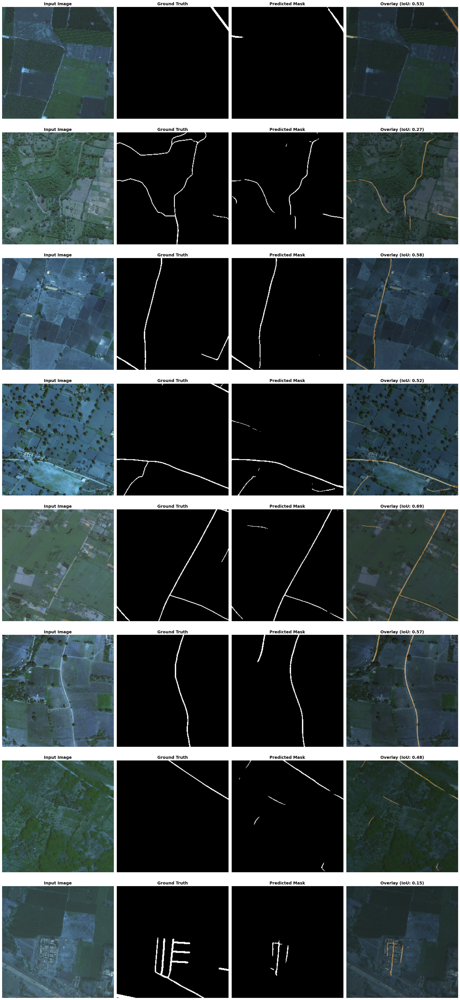

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def plot_predictions(num_samples=8, alpha=0.4):
    # Large, clear visualization — suitable for detailed inspection
    plt.figure(figsize=(22, 6 * num_samples))  # Bigger width & height per sample

    for i in range(num_samples):
        idx = np.random.randint(len(X_test))
        img, mask = load_and_preprocess(X_test[idx], y_test[idx])

        # Predict mask
        pred = model.predict(img[np.newaxis, ...])[0]
        pred = (pred > 0.5).astype(np.float32)

        # Prepare overlay image
        overlay = img.copy()
        if overlay.max() <= 1.0:
            overlay = (overlay * 255).astype(np.uint8)

        # Bright orange overlay color (RGB)
        bright_orange = np.array([255, 140, 0], dtype=np.uint8)

        # Create color overlay
        overlay_color = np.zeros_like(overlay, dtype=np.uint8)
        overlay_color[:, :, 0] = bright_orange[0] * pred.squeeze()
        overlay_color[:, :, 1] = bright_orange[1] * pred.squeeze()
        overlay_color[:, :, 2] = bright_orange[2] * pred.squeeze()

        # Blend overlay with original image
        blended = cv2.addWeighted(overlay, 1 - alpha, overlay_color, alpha, 0)

        # --- Plot all four views ---
        plt.subplot(num_samples, 4, i * 4 + 1)
        plt.imshow(img)
        plt.title("Input Image", fontsize=14, fontweight='bold')
        plt.axis('off')

        plt.subplot(num_samples, 4, i * 4 + 2)
        plt.imshow(mask.squeeze(), cmap='gray')
        plt.title("Ground Truth", fontsize=14, fontweight='bold')
        plt.axis('off')

        plt.subplot(num_samples, 4, i * 4 + 3)
        plt.imshow(pred.squeeze(), cmap='gray')
        plt.title("Predicted Mask", fontsize=14, fontweight='bold')
        plt.axis('off')

        plt.subplot(num_samples, 4, i * 4 + 4)
        plt.imshow(blended)
        plt.title(f"Overlay (IoU: {iou(mask, pred):.2f})", fontsize=14, fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Run visualization
plot_predictions()


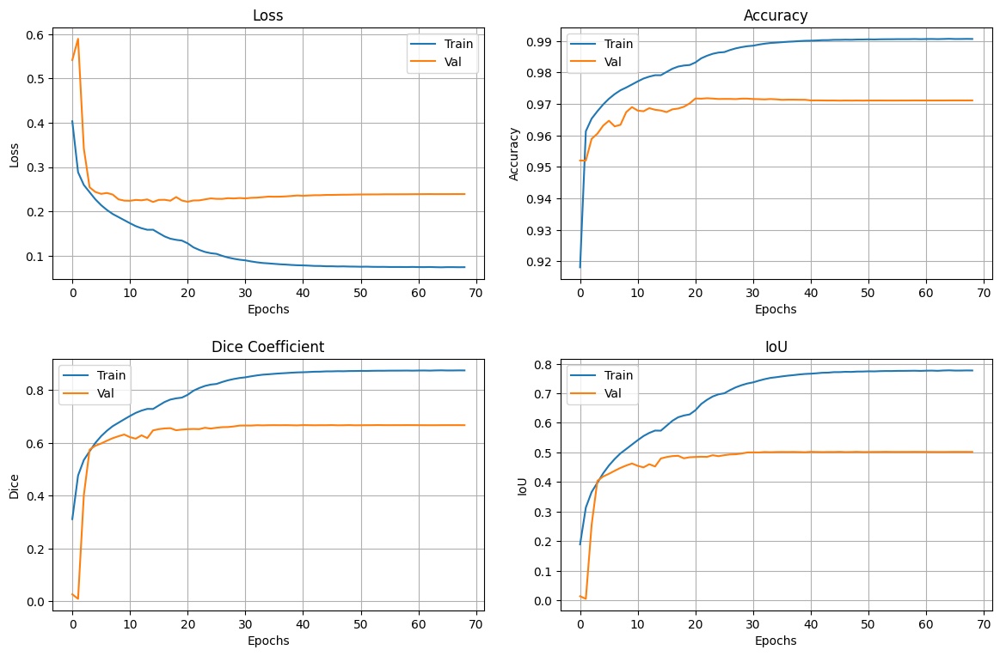

In [ ]:
import matplotlib.pyplot as plt

def plot_training_curves_auto(history):
    hist = history.history
    plt.figure(figsize=(12, 8))

    # Helper function to find the correct metric key by partial name
    def find_key(partial):
        for k in hist.keys():
            if partial in k.lower():
                return k
        return None

    # Find matching metric names
    loss = find_key("loss")
    val_loss = find_key("val_loss")
    acc = find_key("acc") or find_key("binary_accuracy")
    val_acc = find_key("val_acc") or find_key("val_binary_accuracy")
    dice = find_key("dice")
    val_dice = find_key("val_dice")
    iou = find_key("iou")
    val_iou = find_key("val_iou")

    # Set up 2x2 subplot grid
    subplot_idx = 1

    # 1️⃣ Loss
    if loss and val_loss:
        plt.subplot(2, 2, subplot_idx)
        plt.plot(hist[loss], label='Train')
        plt.plot(hist[val_loss], label='Val')
        plt.title("Loss", fontsize=12)
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        subplot_idx += 1

    # 2️⃣ Accuracy
    if acc and val_acc:
        plt.subplot(2, 2, subplot_idx)
        plt.plot(hist[acc], label='Train')
        plt.plot(hist[val_acc], label='Val')
        plt.title("Accuracy", fontsize=12)
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(True)
        subplot_idx += 1

    # 3️⃣ Dice
    if dice and val_dice:
        plt.subplot(2, 2, subplot_idx)
        plt.plot(hist[dice], label='Train')
        plt.plot(hist[val_dice], label='Val')
        plt.title("Dice Coefficient", fontsize=12)
        plt.xlabel("Epochs")
        plt.ylabel("Dice")
        plt.legend()
        plt.grid(True)
        subplot_idx += 1

    # 4️⃣ IoU
    if iou and val_iou:
        plt.subplot(2, 2, subplot_idx)
        plt.plot(hist[iou], label='Train')
        plt.plot(hist[val_iou], label='Val')
        plt.title("IoU", fontsize=12)
        plt.xlabel("Epochs")
        plt.ylabel("IoU")
        plt.legend()
        plt.grid(True)

    plt.tight_layout(pad=2.0)
    plt.show()
plot_training_curves_auto(history)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tqdm import tqdm
import glob
import os

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Lambda

def my_custom(logits):
    # custom logic
    return logits

model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    MaxPooling2D((2,2)),
    # ... more layers ...
    Lambda(my_custom, output_shape=(16, 16, 1024))
    # ... Dense, Activation, etc.
])


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.load_weights('/content/best_road_model.h5')
model.save('best_road_model.keras')

ValueError: Layer count mismatch when loading weights from file. Model expected 1 layers, found 147 saved layers.